# Setup

    git clone https://github.com/ftzeng/ml101
    cd ml101
    pip install -r requirements.txt
    jupyter notebook
    
---

# What is Machine Learning?

- An amalgamation of techniques & concepts from many different fields
- About using algorithms to infer things from data, such as hidden structure, patterns, or relationships
    
    
## What can you do with ML?

- Predict things
- Automate things/make decisions
- Gain insight into a system
- Emulate a system

## What we'll cover today

How to use:

- [`scikit-learn`](http://scikit-learn.org/stable/) for _supervised_ learning (linear regression, logistic regression), _unsupervised_ learning (clustering), and a little bit of natural language processing
- [`pandas`](http://pandas.pydata.org/) for handling data
- [`matplotlib`](http://matplotlib.org/) and [`seaborn`](https://web.stanford.edu/~mwaskom/software/seaborn/) for visualizing data

## Assumptions

- You have some Python experience
- You know a bit of high school math

---

# Two types of problems

Broadly speaking, we deal with two types of data:

- __Continuous__ data - such as temperatures, stock prices, heights, weights. These are __measured__.
- __Discrete__ data - such as gender, yes/no responses, species, dice rolls. These are __countable__.

And these two types of data are typically associated with two types of problems:

- Problems involving continuous data are __regression__ problems, where we want to predict a precise value. For example, what will the temperature be tomorrow?
- Problems involving discrete data are usually __classification__ problems, where we want to identify how to label something. For example, is this email spam or not?

---

# Two types of machine learning

The two primary categories of machine learning are:

- __Supervised__ learning - you have some "ground truth" data, that is, data that you know the "answers" for. For example, the daily temperature for the last year or a set of emails labeled "spam" or "ham" (not spam).
- __Unsupervised__ learning - you don't have ground truth data, but you want to uncover something about the _structure_ of the data. For instance, given a set of weights and heights about a population of animals, are there any distinct groups in the data?

There are other types of learning as well, but they are encountered less frequently.

---

# Supervised Learning

- Provide the algorithm with input data and known answers (output) for each input
- The algorithm learns the relationship between the input and the output
- Returns a function which describes this relationship


## Describing the world in functions

Phenomena can be described mathematically, i.e. by some function.

For example, there is some relationship:

- between a house's size and its sale price
    - e.g. $\text{sales price} = 200 \times \text{square footage}$
- between a runner's speed and their finishing time
    - e.g. $t = \frac{d}{s}$
- between a deer's weight and its height

Supervised machine learning algorithms try to uncover this function!

---

# First, setup the notebook environment

In [6]:
%matplotlib inline
# Plot everything as SVG
%config InlineBackend.figure_formats=['svg']

import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Configure some styling
palette = ['#386DF9', '#FFDC52', '#FF1614', '#62F591', '#AA22FF', '#34495E']
sns.set(font_scale=1.1, style='darkgrid', palette=palette, context='notebook')

# We'll use this later to visualize lines
def make_line(m, b, frm=0, to=200):
    xs = np.linspace(frm, to, 500)
    ys = np.dot(xs[:,np.newaxis], [m]) + b
    return xs, ys

# A simple example

Let's say we have some data about deer heights and weights.

We also have the weights of some other deer but forgot to measure their height.

If we can uncover a relationship between deer weight and height, we could estimate the heights of the deer we forgot to measure.

**This is a perfect opportunity for machine learning!**


### First, we'll use `pandas` to load and preview our data.

In [7]:
# pandas can easily read CSVs into a dataframe
df = pd.read_csv('../data/deer_data.csv')
df.head()

,Weight,Height
0,50.000000,152.738153
1,51.010101,154.806579
2,52.020202,147.596804
3,53.030303,154.066860
4,54.040404,137.015034


In [8]:
# We can access individual columns like so:
df['Height']

0     152.738153
1     154.806579
2     147.596804
3     154.066860
4     137.015034
5     128.871642
6     170.612787
7     142.223472
8     138.838037
9     165.344857
10    147.509380
11    161.315797
12    156.083836
13    160.508618
14    151.228446
...
85    310.639399
86    315.996500
87    305.012566
88    298.715326
89    312.433605
90    298.471697
91    284.377650
92    302.161741
93    303.924094
94    323.779487
95    300.900433
96    308.509750
97    320.240185
98    328.351865
99    331.729403
Name: Height, Length: 100, dtype: float64

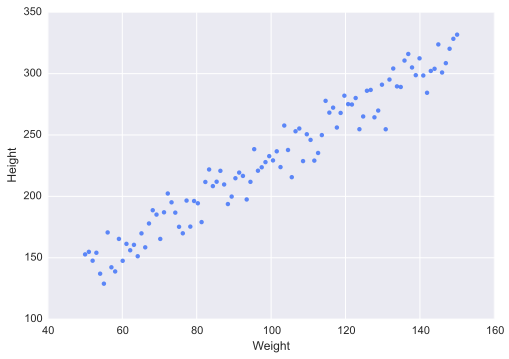

In [9]:
# Let's see what our data looks like
sns.regplot(df['Weight'], df['Height'], fit_reg=False)

You can see that the data has a line-like shape.

We can use _linear regression_, in which we just try to fit a line to the data we have.

(Remember that a line is just a representation of a function)

---

## A refresher on lines

A line's function:

$$
y = mx+b
$$

- $m$ is the "slope"
- $b$ is the "intercept"
- $y$ is the "output" (what we want to predict)
- $x$ is the "input" (the data we want to predict from)

Together, $m$ and $b$ define how a line looks.

![](../assets/lines.svg)

We say that $m$ and $b$ _parameterize_ the function ($m$ and $b$ are called "parameters").

In machine learning, what we are trying to learn are these "parameters" because they are really what describe the function we are looking for.

---

In this deer height/weight example, we have:

- $y$ = deer height
- $x$ = deer weight
- $m$ = ???
- $b$ = ???

Using known deer weights and heights (called _training data_),
linear regression will learn $m$ and $b$ for us.


In [10]:
# We will use scikit-learn's LinearRegression
from sklearn.linear_model import LinearRegression
from sklearn import metrics

# Note the double brackets for X -- this is necessary to get X in the right format/shape
X = df[['Weight']]
y = df['Height']

# Create the model and "fit" it to the data.
# We'll go into more detail how this works in a little bit.
model = LinearRegression()
model.fit(X, y)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=1, normalize=False)

In [11]:
# What value's for m and b did we learn?
m = model.coef_[0]
b = model.intercept_

print('m', m)
print('b', b)

m 1.80435039028
b 50.0953455661


So our algorithm gave us m=1.8,b=50 back and thus we have learned the function:

$$
y = 1.804x + 50.095
$$

for relating a deer's weight to a deer's height.

This function is called the _hypothesis_, and we can now use it to estimate deer heights given deer weights.

Let's see what this looks like.

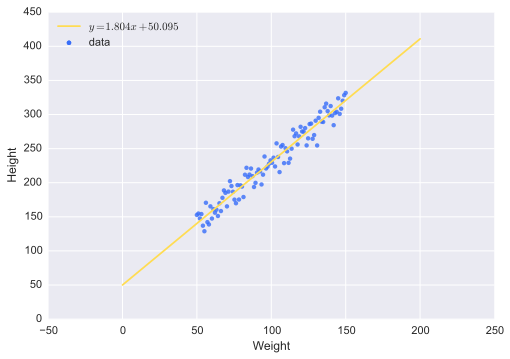

In [12]:
sns.regplot(df['Weight'], df['Height'], fit_reg=False)
xs, ys = make_line(m,b)
plt.plot(xs, ys)
plt.legend(['$y=1.804x + 50.095$', 'data'], loc=2)

The line fits the data really well.

The function I used to generate the data was:

$$
y = 1.8x + 50
$$

So our linear regression model is extremely accurate.

Let's say we have a deer that weighs 150kg. We forgot to record its height. We can use our hypothesis to predict its weight:

$$
y = 1.804(150) + 50.095
$$

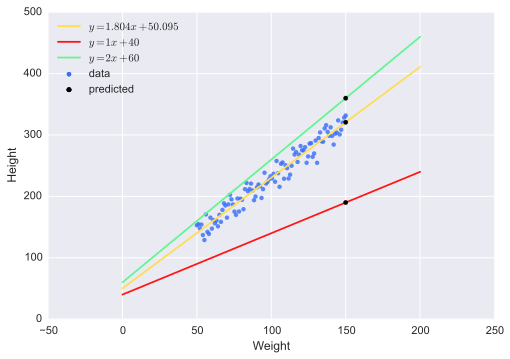

In [13]:
# For comparison, let's draw some different lines, with a predicted point
weight = 150
sns.regplot(df['Weight'], df['Height'], fit_reg=False)

xs, ys = make_line(m,b)
plt.plot(xs, ys, zorder=1)
h1 = m*150 + b

xs, ys = make_line(1,40)
plt.plot(xs, ys, zorder=1)
h2 = 1*150 + 40

xs, ys = make_line(2,60)
plt.plot(xs, ys, zorder=1)
h3 = 2*150 + 60

plt.scatter([weight, weight, weight], [h1,h2,h3], color='k', marker='o', zorder=2)
plt.legend(['$y=1.804x + 50.095$', '$y=1x + 40$', '$y=2x + 60$', 'data', 'predicted'], loc=2)

# How does learning happen?

How does the algorithm come up with good values of $m$ and $b$?

It varies, but usually via a _cost_ or _objective_ function (often notated $J$).

This tells the algorithm how "wrong" it is with its current guesses for $m$ and $b$ on the training data.

The algorithm iteratively tries different parameters (i.e. different guesses at the underlying function) until it can (approximately) minimize this error. That is, it tries to _optimize_ the parameters (thus the algorithms used for selecting these parameters are called "optimization algorithms").

Different optimization algorithms have different ways of picking new guesses. The most popular one is _gradient descent_, which looks for the direction in which the error is decreasing, and then takes a step in that direction.

If we were just finding $m$, this might look like:

![](../assets/gradient_descent.svg)

If we're finding both $m$ and $b$, this might look like:

![](../assets/gradient_descent_3d.svg)

---

# A more complex example

> The __Disposition Matrix__ is a database that United States officials describe as a "next-generation capture/kill list". ... The process determining criteria for killing is not public ([Wikipedia](https://en.wikipedia.org/wiki/Disposition_Matrix))

We could imagine in the near future, if not already, that some of this process is algorithmic. With so many signals out there - your social network activity, quantified-self data, and so on - it may be relatively trivial to automate this process at scale. The Disposition Matrix is an extreme example of the many formulas used to quantify aspects of our lives, such as our eligibility for credit or our cost for insurance and so on.

Just like machine learning can uncover the function behind "natural" relationships like that between a deer's weight and its height, we can use it to "reverse engineer" human-engineered functions as well.


## Psycho-Pass

The show _Psycho-Pass_ imagines a future where every citizen is assigned a "crime coefficient" which measures how threatening they are to society. It's sort of like big-data version of _Minority Report_'s precrime.

![](../assets/psychopass.png)

Let's imagine we live in a similar world. Say we are interested in learning how these crime coefficients are computed. Most citizen's crime coefficients are public, but some peoples' are not - most notably, the police and politicians. If we can uncover the formula for computing crime coefficients, may be can we calculate these secret crime coefficients.

And we have other motives too - the crime coefficient may be systematically biased, and it may not, in fact, predict crime at all.

First, let's consider what data is available. As mentioned, citizens can see their own crime coefficient, and we'll assume that we have some way of collecting them.

In our world there are also a variety of publicly-available datapoints.

Through Facebook, we can see an individual's number of friends and their age. Through Facebook we also have access to some "genetic" information by seeing who their relatives are, and we can cross-reference these relatives with public arrest records to see if an individual has a "criminal" relative.

We also have access to FitBit (or some other quantified-self) data, such as an individuals' average heart rate. Finally, through other data sources, we have estimates of an individual's income as well.

Each of these _features_ - heart rate, criminal relation, number of Facebook friends, age, and income - may be useful in predicting crime coefficients.

In [14]:
reg_data = pd.read_csv('../data/crimecoef.csv')
reg_data.head()

,heart_rate,has_criminal_relative,num_facebook_friends,age,income,crime_coef
0,63.525691,0,420,38.728165,10.309871,10.099342
1,70.875672,0,414,7.168450,15.180091,49.455816
2,71.480779,0,428,36.510977,16.347410,39.200911
3,56.346841,0,296,30.695399,11.170218,39.941107
4,63.238515,0,427,36.192791,10.595675,29.957060


Let's start exploring the data a bit to see if any feature presents a clear relationship with crime coefficients.

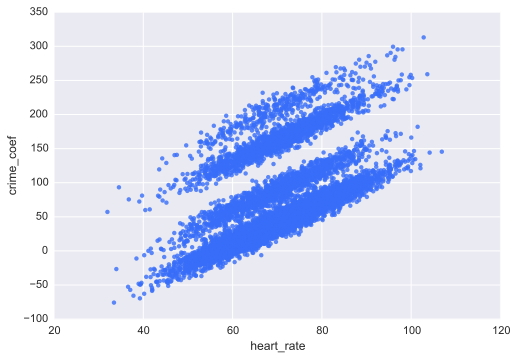

In [15]:
sns.regplot(reg_data['heart_rate'], reg_data['crime_coef'], fit_reg=False)

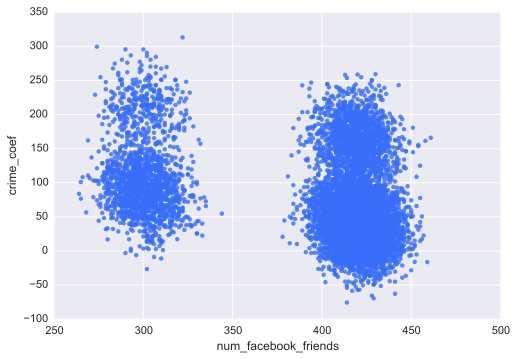

In [16]:
sns.regplot(reg_data['num_facebook_friends'], reg_data['crime_coef'], fit_reg=False)

Heart rate looks fairly informative, so let's try that first. We'll use linear regression again.

We will try using other features later, so it will be helpful if we can quantify how good our predictions are so that we can see if we're doing any better.

### How wrong you are: Mean Squared Error

One way to do so is to look at the __mean squared error__, which basically looks at how far our predicted points are off from the true points on average, penalizing greater mistakes more.

For instance, if I have the data and the predicted values:

| x | y true | y predicted |
|---|--------|-------------|
| 1 | 2      | 3           |
| 2 | 4      | 9           |
| 3 | 6      | 4           |

The mean squared error here would be:

$$
\frac{(3-2)^2 + (9-4)^2 + (4-6)^2}{3} = \frac{1 + 25 + 4}{3} = 10
$$

In [17]:
X = reg_data[['heart_rate']]
y = reg_data['crime_coef']
model = LinearRegression()
model.fit(X, y)
y_pred = model.predict(X)
metrics.mean_squared_error(y_pred, y)

2730.8440948673665

That's a very high mean squared error - we can probably do better.


### Generalizing models: training & testing

But there's another problem here. We are evaluating our model's performance on the data it has already seen. This gives us an overly optimistic estimate of how well we are doing because the model has already "seen" the correct values for each of these inputs. It won't tell us anything about how well the model __generalizes__, that is, how well it does on _new_ data.

The typical practice here is to divide our data into a separate __training__ and __testing__ set. That way our testing set acts as "new" data the model has not yet seen.

There are also more sophisticated ways of getting better estimates of generalizability, but we'll stick with this for now.

Let's split our data into 70% training, 30% testing.

In [72]:
from sklearn.cross_validation import train_test_split

# (set random state for the purposes of demonstration)
train, test = train_test_split(reg_data[['heart_rate', 'crime_coef']], train_size=0.7, random_state=1000)
X_train = train[['heart_rate']]
y_train = train['crime_coef']
model = LinearRegression()
model.fit(X_train, y_train)

# Predict on the testing data
X_test = test[['heart_rate']]
y_test = test['crime_coef']
y_pred = model.predict(X_test)
metrics.mean_squared_error(y_pred, y_test)

2961.8440430013811

 As you can see, the error is higher now (it won't necessarily be, though). Let's look more into what line it has produced.

In [73]:
m = model.coef_[0]
b = model.intercept_

print('m', m)
print('b', b)

m 3.12585676861
b -147.145427463


So the line that we have learned is:

$$
y = 3.126x - 147.145
$$

where $x=\text{heart rate}$.

Here's what that line looks like:

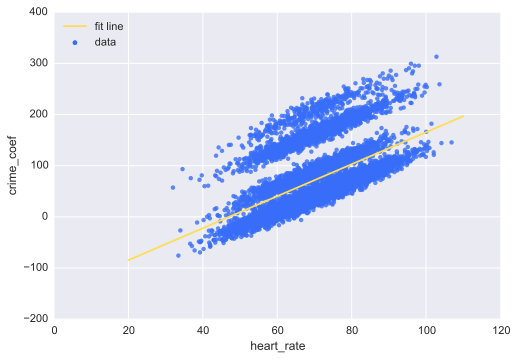

In [77]:
sns.regplot(reg_data['heart_rate'], reg_data['crime_coef'], fit_reg=False)
xs, ys = make_line(m, b, frm=20, to=110)
plt.plot(xs, ys)
plt.legend(['fit line', 'data'], loc=2)

### Adding more features

Let's try incorporating another feature - number of Facebook friends.

In [26]:
# for 3d plots
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import cm
from matplotlib.ticker import LinearLocator, FormatStrFormatter

fig = plt.figure()
ax = fig.gca(projection='3d')
ax.scatter(reg_data['heart_rate'], reg_data['num_facebook_friends'], reg_data['crime_coef'])
ax.set_xlabel('heart_rate')
ax.set_ylabel('num_facebook_friends')
ax.set_zlabel('crime_coef')

In [79]:
# (set random state for the purposes of demonstration)
train, test = train_test_split(reg_data[['heart_rate', 'num_facebook_friends', 'crime_coef']], train_size=0.7, random_state=1000)
X_train = train[['heart_rate', 'num_facebook_friends']]
y_train = train['crime_coef']

model = LinearRegression()
model.fit(X_train, y_train)

# Predict on the testing data
X_test = test[['heart_rate', 'num_facebook_friends']]
y_test = test['crime_coef']
y_pred = model.predict(X_test)
metrics.mean_squared_error(y_pred, y_test)

2481.251737964953

The error went down, but it's still quite high. Let's take a look at what function was produced.

In [80]:
m = model.coef_
b = model.intercept_

print('m', m)
print('b', b)

m [ 3.1562129  -0.40628597]
b 12.832101413


So our function is:

$$
y = 3.156 x_1 - 0.406 x_2 + 12.83
$$

Where:

- $x_1 = \text{heart rate}$
- $x_2 = \text{number of Facebook friends}$


Since we are now using _two_ features to predict a _third_ variable, we are now working in three dimensions. Instead of finding a _line_ now, we are looking for a _plane_, which is a line's equivalent in three dimensions.

In [38]:
fig = plt.figure()
ax = fig.gca(projection='3d')
X = np.arange(20, 120, 1)
Y = np.arange(250, 500, 1)
X, Y = np.meshgrid(X, Y)
Z = 3.156*X - 0.4217*Y + 19.75
surf = ax.plot_surface(X, Y, Z, rstride=1, cstride=1, cmap=cm.rainbow,
        linewidth=0, antialiased=False, alpha=0.7)
ax.set_zlim([-150,300])

ax.scatter(reg_data['heart_rate'], reg_data['num_facebook_friends'], reg_data['crime_coef'])
ax.set_xlabel('heart_rate')
ax.set_ylabel('num_facebook_friends')
ax.set_zlabel('crime_coef')

# Exercise: Predict crime coefficients more accurately

There are still a few features we have not incorporated: `age`, `income`, and `has_criminal_relative`.

See if you can improve crime coefficient prediction accuracy by using them.

Note that as more features are included in the regression, the number of dimensions will go beyond three, and we won't be able to visualize them.

Fortunately, we can rely on other metrics such as the mean squared error to see how we're doing.